In [1]:
print('Hello, World!')

Hello, World!


In [3]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageChops, ImageDraw
from io import BytesIO
from skimage import io
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import cv2
import pprint
import hashlib
import base64
from cryptography.fernet import Fernet
from copy import deepcopy
import random
import zlib
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import variation_of_information as vi
from skimage.metrics import hausdorff_distance
from skimage.metrics import normalized_root_mse as nrmse

In [4]:
def string2binary(string):
    bin_list = []
    for char in string:
        ascii = ord(char)
        bin_ascii = bin(ascii)
        bin_ascii = bin_ascii[2:].zfill(7)
        bin_list.append(bin_ascii)
        bin_string = ''.join(bin_list)
    return bin_string

In [5]:
string2binary('asdasd')

'110000111100111100100110000111100111100100'

In [6]:
def binary2string(bin_string):
    s = ''
    for i in range(0, len(bin_string), 7):
        bin_ascii = bin_string[i:i+7]
        ascii = int(bin_ascii, 2)
        char = chr(ascii)
        s += char
    return s

In [7]:
binary2string('110000111100111100100110000111100111100100')

'asdasd'

In [8]:
def random_shuffle_string(text, seed_value):
    random.seed(seed_value)
    random_permutation = random.sample(range(1, len(text) + 1), len(text) - 1 + 1)
    shuffled_string = ''.join([text[i-1] for i in random_permutation])
    # char_list = list(text)
    # random.shuffle(char_list)
    # shuffled_string = ''.join(char_list)
    return shuffled_string

In [9]:
random_shuffle_string('Stand up straight with your shoulders back.',int(hashlib.sha256("test123".encode()).hexdigest(), 16))

'itshu.ri hasttg  abduou nkaol rthyswr pcdeS'

In [10]:
def unshuffle_string(shuffled_text, seed_value):
    random.seed(seed_value)
    random_permutation = random.sample(range(1, len(shuffled_text) + 1), len(shuffled_text) - 1 + 1)
    original_string = ''
    idx2char = {}
    idx=0
    for i in random_permutation:
        idx2char[i] = shuffled_text[idx]
        idx += 1
    # print(shuffled_text)
    # print(idx2char)
    for i in range(len(shuffled_text)):
        original_string += idx2char[i+1]
    return original_string

In [11]:
unshuffle_string('itshu.ri hasttg  abduou nkaol rthyswr pcdeS',int(hashlib.sha256("test123".encode()).hexdigest(), 16))

'Stand up straight with your shoulders back.'

In [12]:
def encrypt_string(string, password):
    utf8_password = password.encode()
    sha256_seed_value = int(hashlib.sha256(utf8_password).hexdigest(), 16)
    shuffled_string = random_shuffle_string(string, sha256_seed_value)
    md5_hash = hashlib.md5(utf8_password).hexdigest()
    utf8_md5_hash = md5_hash.encode()
    base64_cipher_key = base64.urlsafe_b64encode(utf8_md5_hash)
    fernet_cipher = Fernet(base64_cipher_key)
    utf8_string = shuffled_string.encode()
    return fernet_cipher.encrypt(utf8_string).decode()

In [13]:
encrypt_string('asdasd', 'test123')

'gAAAAABlgtn80AZzuCkWKN-i04lIEhNvHzsqhiO8LrsgcdJb20sfEfH8cre0a4_bWi9bjEBYNy_NHYuDPLujEHo_FKfXZpouVQ=='

In [14]:
def decrypt_string(string, password):
    utf8_password = password.encode()
    md5_hash = hashlib.md5(utf8_password).hexdigest()
    utf8_md5_hash = md5_hash.encode()
    base64_cipher_key = base64.urlsafe_b64encode(utf8_md5_hash)
    fernet_cipher = Fernet(base64_cipher_key)
    utf8_string = string.encode()
    shuffled_decryption = fernet_cipher.decrypt(utf8_string).decode()
    sha256_seed_value = int(hashlib.sha256(utf8_password).hexdigest(), 16)
    unshuffled_decryption = unshuffle_string(shuffled_decryption, sha256_seed_value)
    return unshuffled_decryption

In [15]:
decrypt_string('gAAAAABlgDbwOW_I9CVlZQluiiPtLMwzMlJJSsIMzFsvnG-h4nFkYGD8cvZ7vTPig4nVo5f0H3TgkZWdZ3ItZA6VcZqQXHAHOw==', 'test123')

'asdasd'

In [16]:
def encode_message(image, text, password):
    image = deepcopy(image)
    encrypted_text = encrypt_string(text, password)
    bin_encrypted_text = string2binary(encrypted_text)
    bin_encrypted_text_length = bin(len(encrypted_text))#[2:].zfill(32)
    bin_encrypted_text_length = bin_encrypted_text_length[2:].zfill(32)
    bin_message = iter(bin_encrypted_text_length + bin_encrypted_text)

    encoding_capacity = 0
    channels = 0
    if len(image.shape) == 2:
        channels = 1
    else:
        channels = 3
    encoding_capacity = image.shape[0] * image.shape[1] * channels

    total_bits = 32 + 7 * len(encrypted_text)
    if total_bits > encoding_capacity:
        raise Exception("Message bits exceed given image's pixel count.")

    flag = False
    modified_bits = 0
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # pixel = image[i, j]
            for k in range(channels):
                try:
                    bit = next(bin_message)
                except StopIteration:
                    flag = True
                    break
                if channels == 3:
                    if bit == '0' and (image[i, j, k] & 1):
                        # pixel[k] -= 1
                        image[i, j, k] ^= 1
                    elif bit == '1' and not (image[i, j, k] & 1):
                        # pixel[k] += 1
                        image[i, j, k] |= 1
                    modified_bits += 1
                else:
                    if bit == '0' and (image[i, j] & 1):
                        # pixel[k] -= 1
                        image[i, j] ^= 1
                    elif bit == '1' and not (image[i, j] & 1):
                        # pixel[k] += 1
                        image[i, j] |= 1
                    modified_bits += 1
            if flag:
                break
        if flag:
            break

    loss = (modified_bits / encoding_capacity) * 100
    return image, loss


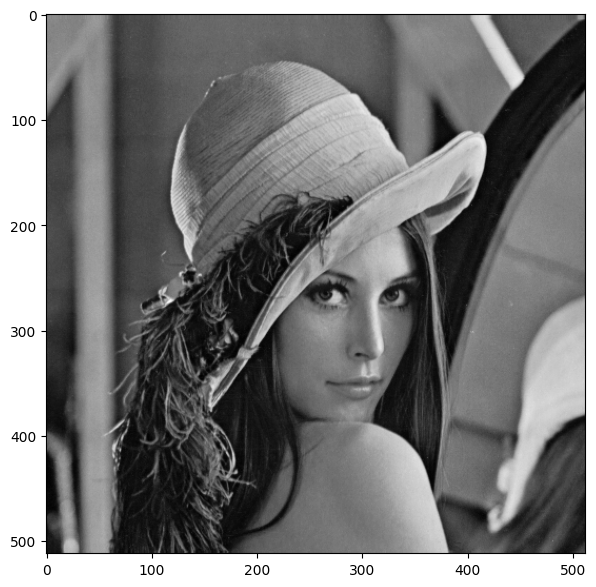

In [17]:
lenna = Image.open('DIP3E_CH08_Original_Images/Fig0809(a).tif')
lenna = np.array(lenna)
fig = plt.figure(figsize=(10, 7))
plt.imshow(lenna, origin='upper', cmap='gray')

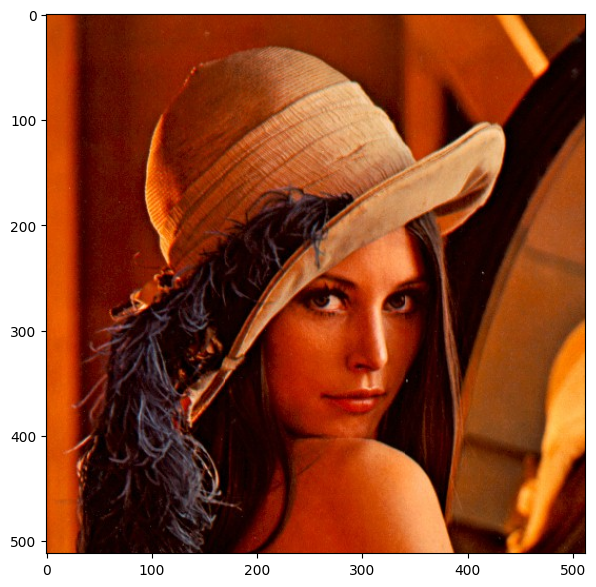

In [18]:
rgb_lenna = Image.open('DIP3E_Original_Images_CH06/Fig0638(a)(lenna_RGB).tif')
rgb_lenna = np.array(rgb_lenna)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_lenna, origin='upper')

In [19]:
message = 'Stand up straight with your shoulders back.'
password = 'test123'
encoded_lenna, encoded_lenna_loss = encode_message(lenna, message, password)

In [20]:
print(encoded_lenna_loss)

0.38604736328125


In [21]:
print(encoded_lenna[0,30])
print(lenna[0,30])

132
133


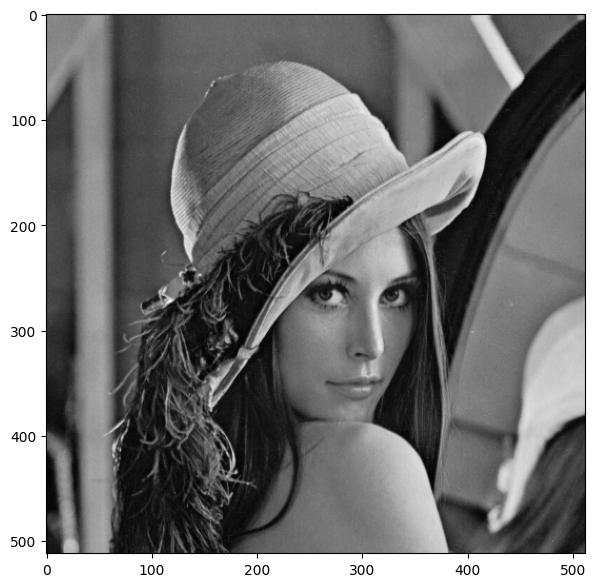

In [22]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(encoded_lenna, origin='upper', cmap='gray')

In [23]:
message = 'Work as hard as you possibly can on at least one thing and see what happens.'
password = 'test123'
encoded_rgb_lenna, encoded_rgb_lenna_loss = encode_message(rgb_lenna, message, password)

In [24]:
print(encoded_rgb_lenna_loss)

0.1678466796875


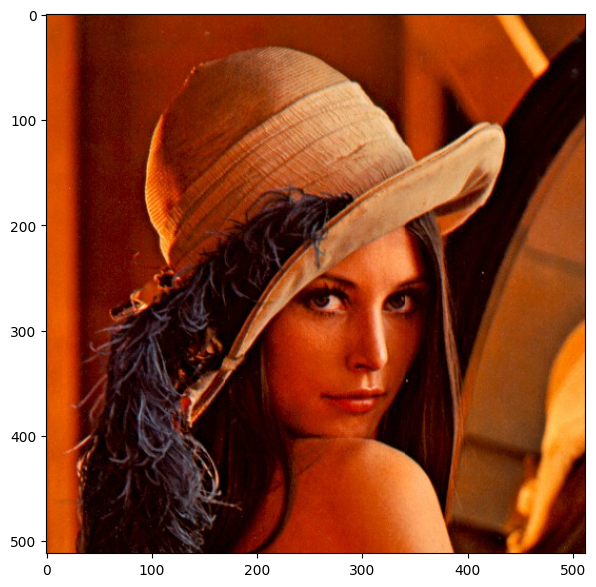

In [25]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(encoded_rgb_lenna, origin='upper')

In [26]:
def decode_message(image, password):
    image = np.array(deepcopy(image))
    channels = 0
    # image.reshape((image.shape[0], image.shape[1], 1))
    # image = image[:, :, np.newaxis]
    if len(image.shape) == 2:
        channels = 1
    else:
        channels = 3
    # channels = image.shape[2]

    res = ''
    extracted_bits = 0
    bits = 0
    flag = False
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            for k in range(channels):
                if channels == 3:
                    res += str(image[i, j, k] & 1)
                    extracted_bits += 1
                    if extracted_bits == 32 and bits == 0:
                        bits = 7 * int(res, 2)
                        res = ''
                        extracted_bits = 0
                    elif extracted_bits == bits:
                        flag = True
                        break
                else:
                    res += str(image[i, j] & 1)
                    extracted_bits += 1
                    if extracted_bits == 32 and bits == 0:
                        bits = 7 * int(res, 2)
                        print(f'Characters: {bits/7}')
                        res = ''
                        extracted_bits = 0
                    elif extracted_bits == bits:
                        flag = True
                        break
            if flag:
                break
        if flag:
            break
    print(f'Res: {res}')
    res_string = binary2string(res)
    print(f'Res String: {res_string}')
    return decrypt_string(res_string, password)

In [27]:
decoded_rgb_lenna_message = decode_message(encoded_rgb_lenna, 'test123')

Res: 11001111000001100000110000011000001100000110000101101100110011111101001101111100010001110011110111111000001110011111010111000111110010110010101111110010010110001110110011011111101000101001010100101101110110000111000011111000100100101110001101010011011010001111101001011010011001101101101110011101100101011001110100111110001100101100101101101011101110011100110000111000011111001010111111000010101010110010011001110111000001100101010001111001101100011010101111010111001001101011101010111110011100100110000101100111111000110011011101110110001110011110101011010011110010010011001010000100011001101011011001110101011010011000111011010010001101001110111100110011011010011110100110100111000001101100010111111101001100100010100001011111011011111110001000010110110010010001100111100100101100011010101011100110011001001000100010011001101110101110001110001011001110011001011101101101101111011010101011100011101011111110011000010110010110001011101010011001101101110101101011011111101001101001110101101110001

In [28]:
print(decoded_rgb_lenna_message)

Work as hard as you possibly can on at least one thing and see what happens.


In [29]:
decoded_lenna_message = decode_message(encoded_lenna, 'test123')

Characters: 140.0
Res: 11001111000001100000110000011000001100000110000101101100110011111101001101111100001011110011101010110110011000101000100101001011110010110011100011011100011100100110100010110101001000111100001100011000100011100011101100110001101011101101101101101101010101011011010011110101011001011101101100010110010011001100110010111001001100011011100011110101001101011100110110011011111110111101101001100110111011010000110110100111100010101011001110101101010010101011001110101010000011100011110100111000101101011101010111011001001111110101011010010110011101100010000101100001011000011010001111010101000111100111101110111101011000101000101111000111101001011010110001010010101101100110100110100001111010110100010010011100011011000110010011010010111101011110100110001100010010100100111000110011011001000110111110110010100101101100101011001011011000110111010111011001011010011000111010001001000101010001101111001101101100110000101110101011100010001110110001100110010010101010011100100001101101100

In [30]:
print(decoded_lenna_message)

Stand up straight with your shoulders back.


## Rough Work

In [ ]:
# @title Rough Work
random_shuffle_string('Stand up straight with your shoulders back.', 42)
print(int(hashlib.sha256('asdasd'.encode()).hexdigest(), 16))
random_shuffle_string('Stand up straight with your shoulders back.', int(hashlib.sha256('asdasd'.encode()).hexdigest(), 16))
s = 'Stand up straight with your shoulders back.'
random.seed(int(hashlib.sha256('test123'.encode()).hexdigest(), 16))
random_permutation = random.sample(range(1, len(s) + 1), len(s) - 1 + 1)
print(len(s))
print(random_permutation)
print(len(random_permutation))
scrambled_s = ''.join([s[i-1] for i in random_permutation])
print(scrambled_s)
random.seed(int(hashlib.sha256('test123'.encode()).hexdigest(), 16))
random_permutation = random.sample(range(1, len(scrambled_s) + 1), len(scrambled_s) - 1 + 1)
original_string = ''
idx2char = {}
idx=0
for i in random_permutation:
    idx2char[i] = scrambled_s[idx]
    idx += 1
print(scrambled_s)
# print(idx2char)
for i in range(len(scrambled_s)):
    original_string += idx2char[i+1]
print(original_string)

## .

In [31]:
def intensity2binary(pixel):
    r, g, b = pixel
    return (f'{r:08b}', f'{g:08b}', f'{b:08b}')

In [32]:
intensity2binary((220, 110, 96))

('11011100', '01101110', '01100000')

In [33]:
def binary2intensity(bin_pixel):
    bin_r, bin_g, bin_b = bin_pixel
    return (int(bin_r, 2), int(bin_g, 2), int(bin_b, 2))

In [34]:
binary2intensity(('11011100', '01101110', '01100000'))

(220, 110, 96)

In [35]:
def fuse_pixels(bin_pixel1, bin_pixel2):
    return (bin_pixel1[0][:4] + bin_pixel2[0][:4], bin_pixel1[1][:4] + bin_pixel2[1][:4], bin_pixel1[2][:4] + bin_pixel2[2][:4])

In [36]:
fuse_pixels(('11011100', '01101110', '01100000'), ('11011100', '01101110', '01100000'))

('11011101', '01100110', '01100110')

In [37]:
def string2binary4(string):
    bin_list = []
    for char in string:
        ascii = ord(char)
        bin_ascii = bin(ascii)
        bin_ascii = bin_ascii[2:].zfill(4)
        bin_list.append(bin_ascii)
        bin_string = ''.join(bin_list)
    return bin_string

In [38]:
def binary2string4(bin_string):
    s = ''
    for i in range(0, len(bin_string), 4):
        bin_ascii = bin_string[i:i+4]
        ascii = int(bin_ascii, 2)
        char = chr(ascii)
        s += char
    return s

In [39]:
def encode_image(carrier_image, embedded_image, password):
    carrier_image = deepcopy(carrier_image)
    embedded_image = deepcopy(embedded_image)
    # if carrier_image.size[0] * carrier_image.size[1] * 3 < embedded_image.size[0] * embedded_image.size[1] * 3 * 7 + 32:
    #     raise Exception("Embedded image's pixel count exceed carrier image's pixel count.")

    embedded_image_original_resolution = embedded_image.shape
    embedded_image_message = ''
    flattened_embedded_image = embedded_image.flatten()
    for i in range(len(flattened_embedded_image)):
        msb4 = flattened_embedded_image[i] >> 3
        char = chr(msb4 + 64)
        embedded_image_message += char

    print(embedded_image_message)
    print(len(embedded_image_message))
    encrypted_text = encrypt_string(embedded_image_message, password)
    bin_encrypted_text = string2binary(encrypted_text)
    bin_encrypted_text_length = bin(len(encrypted_text))#[2:].zfill(32)
    bin_encrypted_text_length = bin_encrypted_text_length[2:].zfill(32)
    bin_message = iter(bin_encrypted_text_length + bin_encrypted_text)

    encoding_capacity = 0
    channels = 0
    if len(carrier_image.shape) == 2:
        channels = 1
    else:
        channels = 3
    encoding_capacity = carrier_image.shape[0] * carrier_image.shape[1] * channels

    total_bits = 32 + 7 * len(encrypted_text)
    if total_bits > encoding_capacity:
        raise Exception("Message bits exceed given image's pixel count.")

    flag = False
    modified_bits = 0
    for i in range(carrier_image.shape[0]):
        for j in range(carrier_image.shape[1]):
            # pixel = image[i, j]
            for k in range(channels):
                try:
                    bit = next(bin_message)
                except StopIteration:
                    flag = True
                    break
                if channels == 3:
                    if bit == '0' and (carrier_image[i, j, k] & 1):
                        # pixel[k] -= 1
                        carrier_image[i, j, k] ^= 1
                    elif bit == '1' and not (carrier_image[i, j, k] & 1):
                        # pixel[k] += 1
                        carrier_image[i, j, k] |= 1
                    modified_bits += 1
                else:
                    if bit == '0' and (carrier_image[i, j] & 1):
                        # pixel[k] -= 1
                        carrier_image[i, j] ^= 1
                    elif bit == '1' and not (carrier_image[i, j] & 1):
                        # pixel[k] += 1
                        carrier_image[i, j] |= 1
                    modified_bits += 1
            if flag:
                break
        if flag:
            break

    loss = (modified_bits / encoding_capacity) * 100
    return carrier_image, loss
    # return encode_message(carrier_image, embedded_image_message, password)

## Rough Work

In [44]:
# @title Rough Work
flattened_rgb_lenna = rgb_lenna.flatten()
print(flattened_rgb_lenna)
unflattened_rgb_lenna = flattened_rgb_lenna.reshape((512, 512, 3))

[201  75   1 ...  74  28   5]


## .

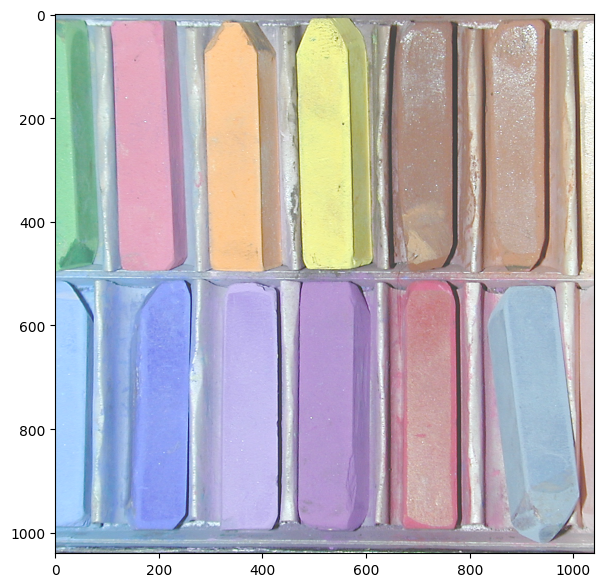

In [40]:
rgb_chalk = Image.open('DIP3E_Original_Images_CH06/Fig0635(middle_row_left_chalk ).tif')
rgb_chalk = np.array(rgb_chalk)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_chalk, origin='upper')

In [41]:
rgb_chalk.shape

(1040, 1040, 3)

In [42]:
resized_rgb_chalk = cv2.resize(rgb_chalk, dsize=(150, 150), interpolation=cv2.INTER_CUBIC)

In [43]:
resized_rgb_chalk.shape

(150, 150, 3)

In [44]:
carrier_rgb_lenna = encode_image(rgb_lenna, resized_rgb_chalk, 'test123')

RVXRVXSVXRVXRVXSVXQVXSVXSVXSVXSVXSWYSVXTWXTWYSVXTVXTVXSVXSUXSUXTVXTVXTVXTVXTVXTVXTVXTVXTVWTVXTVWSUXTVXTVXTUXTVXTVXTVWTVWTVXTVXTVWUVWUUWSTUTUWUVWUVWVVWUUVUUVUVWTUWTUVUUWTUVTTVUUWTUVTUVSSTSTUSSTSSTSSTSSTRSTRRSRRSRRSRRSRRSSRSSSSPPPQQPRRRSRRSSRRSQSSQTTSSSRTSSSSSSRSRRRSSSSRSRRRSRRSRRSQQSQQSRRTRRSRRSQRTRSSQQTRRTRRTRQTRQTRRSQQSRQTRQSRQTSRTRQTRRTRQTRQTSRUSRURRURQUSRURQUSRVSRVSRUSRUSRUSRURQUSRURRUSQVSRUSRUSRUSQUSRVSRURQUSRUSRUSRUTRVTSVUTVTSVUTVUTWUTVUTVUTPTUPTUPUUOTUPTUPUVQVVUYYUXYWZ\SWYPUWQTWRUXSVXSVXTWXTXXUXXTWWVXYUXYTWXSVWTVXSUVSTUUWXTVWUVXTVWTVWVXYTVXWXZWXZWXYUWXXYZWXZVWYTVWUVXUWXUVXUVWUVWUVWVVWSTTUUVUVWTUWSSUTUVTUVUUWUUVUUVUUVUUWUUVUVWUVXTTVRSTUVVSTUVUVTTUTTWWXT[]T[\TZZS]\TYYRWXPWXPWXQWXQWWQRSQRQRSSTSRSRRRRRSRRTRQSSRRRRRRQQSRRSRRSQRSQRSRRSQQRQPSQQSQQSRRTRRSQQSQQSRSSQQTRRTRQTSRTRQUSSURSURRURRVTSVSRUSQUSQVSRVSRVSRVSRVTSURPTQPTRPTQQTQPSQOSQOTQOSONSONQMJRPLVSQUSTVTSVTSVSSWTSWUSVURWVTWUTXVUVUTUSROVSRVSSXTRWSQWSQVSQWSQWSFMKZ]^\__Y]^Z]^Y\]Z]_Z]^ZUW\UY\WY[VX[VX\VX\UX\UW\UW\UX[TW[TW\TWWSWURUURTUQTK

In [45]:
carrier_rgb_lenna_image, carrier_rgb_lenna_loss = carrier_rgb_lenna
print(carrier_rgb_lenna_loss)

80.18747965494791


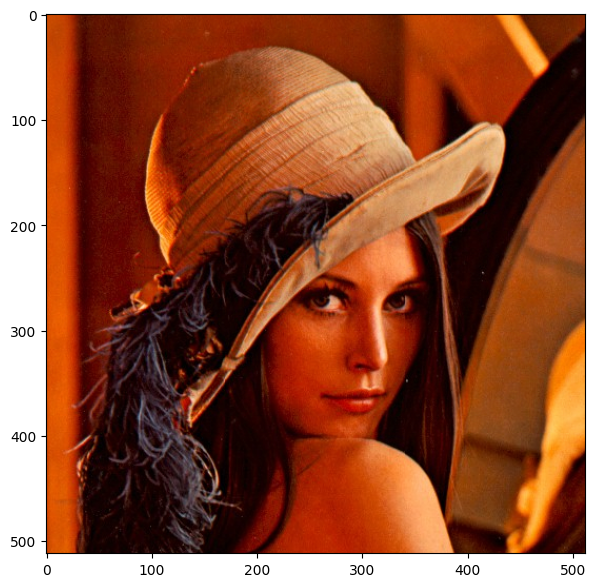

In [46]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(carrier_rgb_lenna_image, origin='upper')

In [47]:
def decode_image(image, password, resolution):
    image = np.array(deepcopy(image))
    channels = 0
    # image.reshape((image.shape[0], image.shape[1], 1))
    # image = image[:, :, np.newaxis]
    if len(image.shape) == 2:
        channels = 1
    else:
        channels = 3
    # channels = image.shape[2]

    res = ''
    extracted_bits = 0
    bits = 0
    flag = False
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            for k in range(channels):
                if channels == 3:
                    res += str(image[i, j, k] & 1)
                    extracted_bits += 1
                    if extracted_bits == 32 and bits == 0:
                        bits = 7 * int(res, 2)
                        res = ''
                        extracted_bits = 0
                    elif extracted_bits == bits:
                        flag = True
                        break
                else:
                    res += str(image[i, j] & 1)
                    extracted_bits += 1
                    if extracted_bits == 32 and bits == 0:
                        bits = 7 * int(res, 2)
                        print(f'Characters: {bits/7}')
                        res = ''
                        extracted_bits = 0
                    elif extracted_bits == bits:
                        flag = True
                        break
            if flag:
                break
        if flag:
            break
    # print(f'Res: {res}')
    res_string = binary2string(res)
    # print(f'Res String: {res_string}')
    decrypted_string = decrypt_string(res_string, password)
    flattened_decrypted_image = np.array([ord(char) for char in decrypted_string])
    for i in range(len(flattened_decrypted_image)):
        flattened_decrypted_image[i] -= 64
        flattened_decrypted_image[i] <<= 3
    unflattened_decrypted_image = flattened_decrypted_image.reshape(resolution)
    return unflattened_decrypted_image

In [48]:
carrier_rgb_lenna_payload = decode_image(carrier_rgb_lenna_image, 'test123', (150, 150, 3))

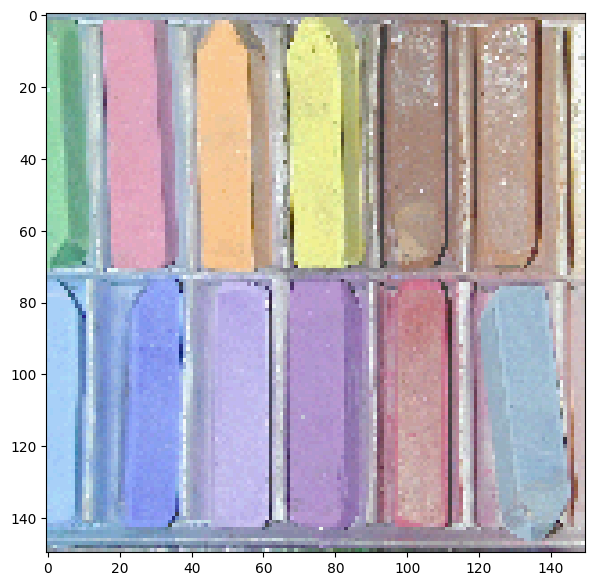

In [49]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(carrier_rgb_lenna_payload, origin='upper')

In [50]:
resized_rgb_lenna = cv2.resize(rgb_lenna, dsize=(300, 300), interpolation=cv2.INTER_CUBIC)

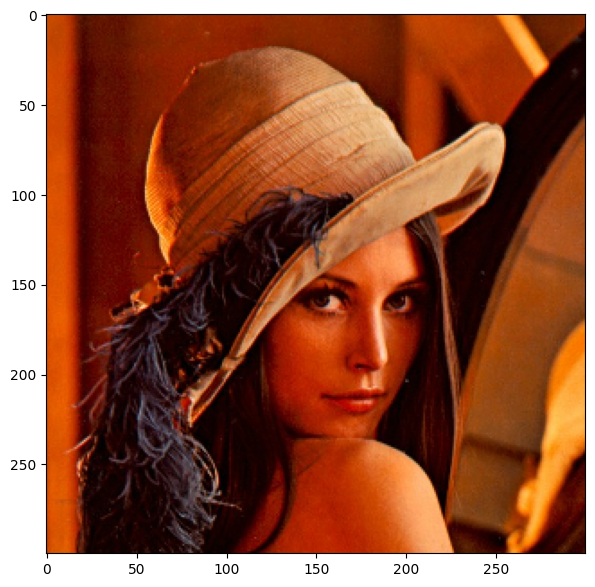

In [51]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(resized_rgb_lenna, origin='upper')

In [52]:
carrier_rgb_chalk = encode_image(rgb_chalk, resized_rgb_lenna, 'test123')

YI@YI@YI@YI@YI@YI@YI@YI@YI@YH@XH@WG@VF@VF@TD@RD@PC@NC@LB@JB@IB@IA@IB@JB@JB@KC@LCAKB@KB@KB@KB@LC@LC@KB@LB@KB@KB@LC@KC@LC@LC@LC@LC@LB@LC@LC@MD@MD@MD@MD@NC@ND@OD@ND@OD@OD@OD@PD@PD@PE@QE@PD@QE@QE@RE@QE@QE@RF@RE@RE@RE@QE@RE@RE@QE@RE@SFARE@RE@RE@QE@QD@RE@QE@RE@SE@RE@RE@RE@RE@RE@RD@SE@SE@SE@RD@RD@SD@SD@RD@RD@SE@RE@RD@RD@RE@QD@RD@RD@RD@RE@RD@RD@RE@RE@RE@RE@RD@RD@RD@RE@RE@QE@QE@QD@QD@QE@QE@RE@QE@QE@QE@RE@QE@QE@QE@QE@QE@RE@RE@RE@RE@RE@RE@QE@QE@QE@QE@PE@QE@QE@QE@QD@QD@QE@QE@QD@QE@QD@QD@PD@QD@PD@PD@PD@PE@PD@QE@PD@PD@PD@PD@QE@PD@PD@PD@QE@PE@PE@OE@OE@OD@OD@ND@ND@ND@MC@MC@MC@MC@LC@LC@LC@KC@LC@LC@ND@OD@RF@SF@TG@VG@VG@WH@XH@XH@XH@XI@XH@XH@XH@WG@WG@XH@XH@YH@XH@XH@YH@YH@XH@XH@XH@XH@XH@XH@XH@WH@WG@WG@WG@WG@WG@WG@WH@WH@VG@VG@VG@UG@UG@UG@UG@UH@UH@VH@UG@VG@UG@XH@[K@^NA_QB_RD_SE_TE_TF_TG_TF_SE_QB\NAXKARF@LD@KC@KB@KC@KC@KD@LD@LC@LC@LC@LD@MD@MD@MD@MD@MD@MD@ME@MD@MD@MD@MD@MD@MD@MD@MD@NE@ND@ND@ND@MD@NE@ND@OE@OD@OD@YI@YI@YI@YI@YI@YH@YI@YH@YH@XH@XG@WG@VF@VF@TE@SD@OC@MC@LC@KCAJB@JB@JB@KCAKC@KB@KB@KB@LB@LB@MC@LB@MCAL

In [53]:
carrier_rgb_chalk_image, carrier_rgb_chalk_loss = carrier_rgb_chalk
print(carrier_rgb_chalk_loss)

77.68528106508876


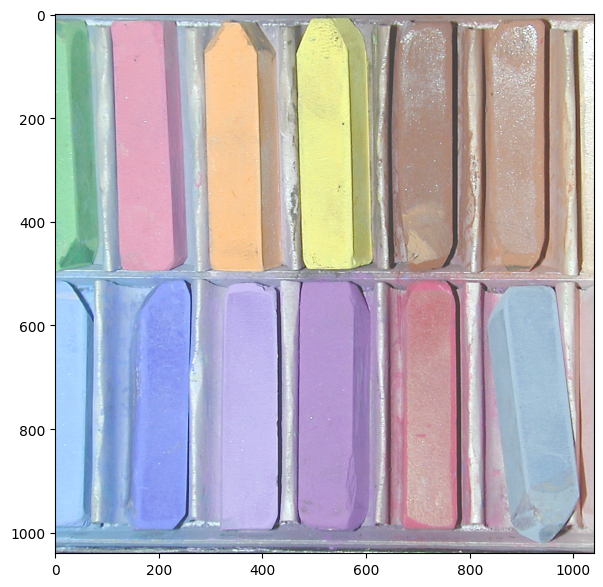

In [54]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(carrier_rgb_chalk_image, origin='upper')

In [55]:
carrier_rgb_chalk_payload = decode_image(carrier_rgb_chalk_image, 'test123', (300, 300, 3))

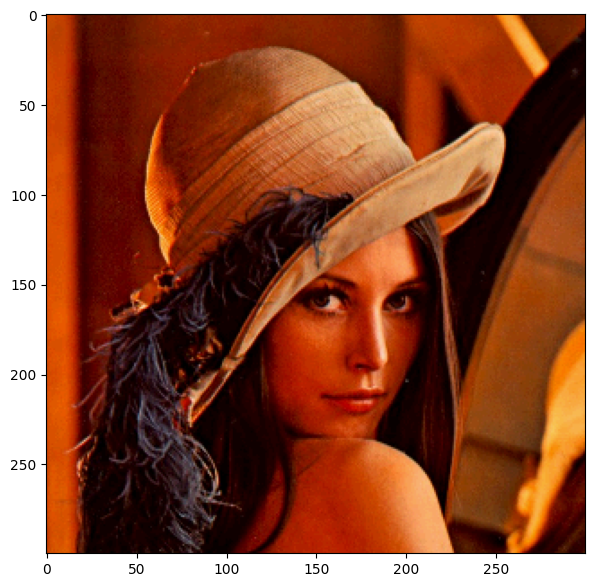

In [56]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(carrier_rgb_chalk_payload, origin='upper')

In [57]:
def cosine_distance(p, q):
    dist = 0
    normP = 0
    normQ = 0
    for x, y in zip(p, q):
        dist += float(x) * float(y)
        normP += float(x)**2
        normQ += float(y)**2
    return 1 - (dist/(np.sqrt(normP) * np.sqrt(normQ)))

In [58]:
flattened_rgb_chalk = rgb_chalk.flatten()
flattened_carrier_rgb_chalk_image =  carrier_rgb_chalk_image.flatten()

In [59]:
similarity_rgb_chalk = 1 - cosine_distance(flattened_rgb_chalk, flattened_carrier_rgb_chalk_image)
print(similarity_rgb_chalk)

0.9999941026629972


In [60]:
def normalization(image, range=255):
     image_array = np.array(image)
     image_min = np.min(image_array)
     image_max = np.max(image_array)
     return ((image_array - image_min)/(image_max - image_min)) * range

In [61]:
difference_rgb_chalk = rgb_chalk - carrier_rgb_chalk_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


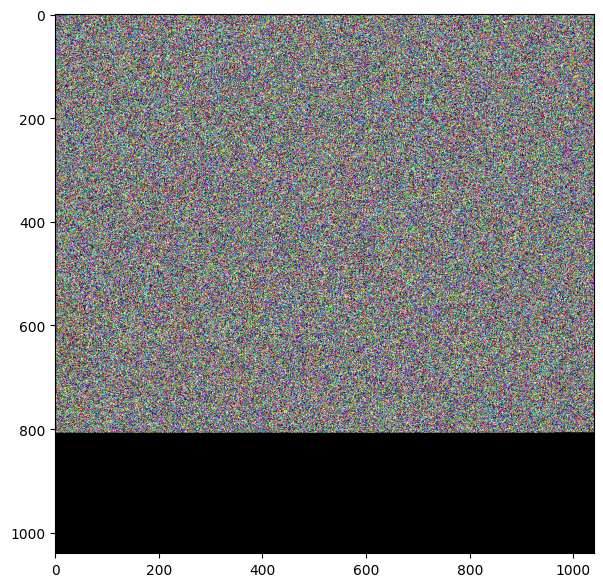

In [62]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(normalization(difference_rgb_chalk, 255), origin='upper')

In [92]:
flattened_carrier_rgb_lenna = carrier_rgb_lenna_image.flatten()
flattened_rgb_lenna = rgb_lenna.flatten()

In [93]:
similarity_rgb_lenna = 1 - cosine_distance(flattened_carrier_rgb_lenna, flattened_rgb_lenna)
print(similarity_rgb_lenna)

0.999978083347021


In [94]:
difference_rgb_lenna = rgb_lenna - carrier_rgb_lenna_image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


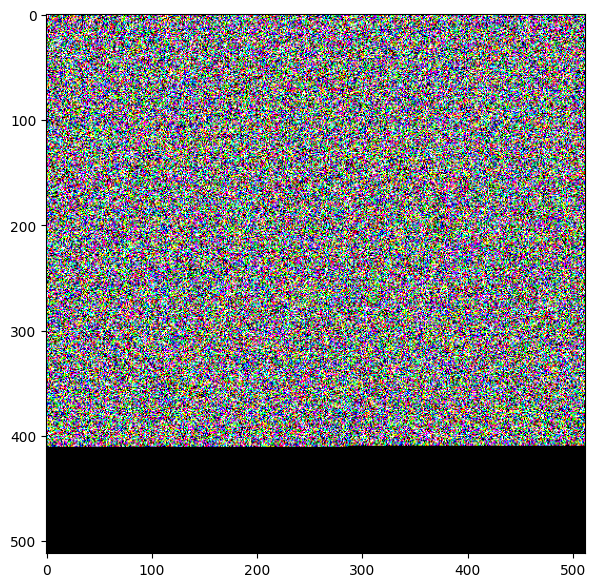

In [95]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(normalization(difference_rgb_lenna, 255), origin='upper')

In [63]:
def difference_analysis(original_image, carrier_image):
    flattened_original = original_image.flatten()
    flattened_carrier = carrier_image.flatten()
    similarity = 1.0 - cosine_distance(flattened_original, flattened_carrier)
    difference = original_image - carrier_image
    return similarity, normalization(difference, 255)

In [64]:
letter_to_usa = open("osamabinladen.txt", "r").read()

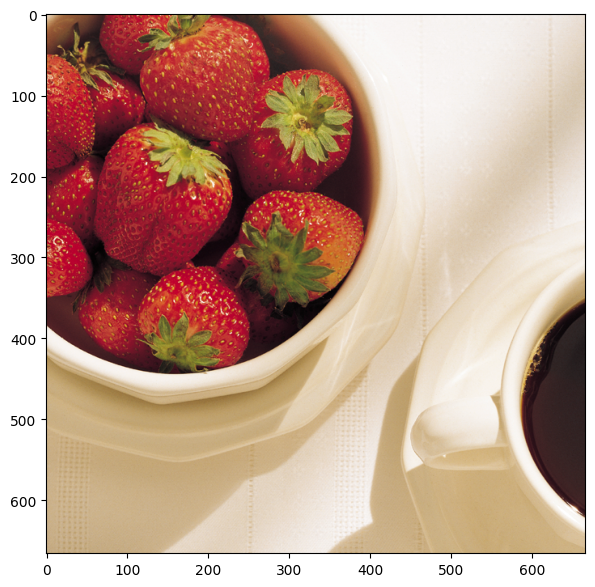

In [65]:
rgb_strawberries = Image.open('DIP3E_Original_Images_CH06/Fig0631(a)(strawberries_coffee_full_color).tif')
rgb_strawberries = np.array(rgb_strawberries)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_strawberries, origin='upper')

In [66]:
carrier_rgb_strawberries_image, carrier_rgb_strawberries_loss = encode_message(rgb_strawberries, letter_to_usa, 'test123')

In [67]:
print(carrier_rgb_strawberries_loss)

5.866827788749711


In [68]:
rgb_strawberries_similarity, rgb_strawberries_difference = difference_analysis(rgb_strawberries, carrier_rgb_strawberries_image)

In [69]:
print(rgb_strawberries_similarity)

0.9999995022670305


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


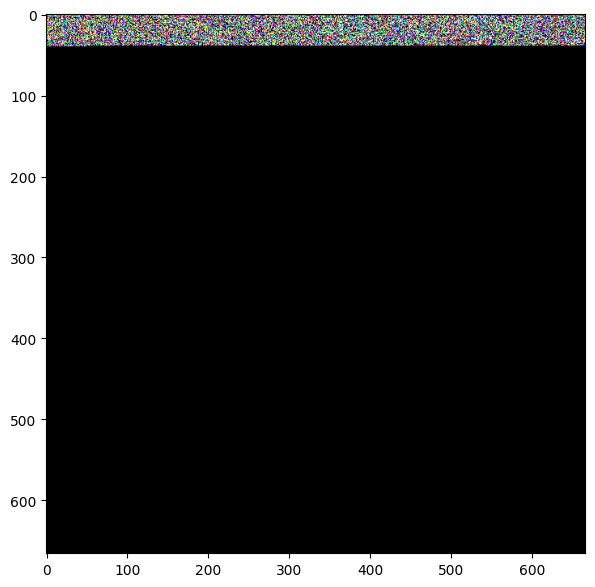

In [70]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_strawberries_difference, origin='upper')

In [119]:
carrier_rgb_strawberries_image_payload = decode_message(carrier_rgb_strawberries_image, 'test123')

Res: 11001111000001100000110000011000001100000110000101101100110011111000101110001101010010101011000101100011111101101001010110111110100011010100100100101110000110000100001110000011101011010110110100010111001011011001011010110010111101011010011101110101001010010011011111100010001101101011001011000111000101110010101101010000011011000100110101100101101010100000101110011110100110110110100111110101101001010001101101001110101010100011001111101100011100010110111110001011011011000011011100011010100110000101011011101101001010011100111001111010001011011001100111110110110110111100011000011101100111010001100010110001111110001011111100100111011011010111100011101100011010110110011010000111010011100100111011100110010101100011000111000010101011010111111110010010110110100100110110011010011000101010101100110011010001000110101010110001011011010011011110100101000111111001011110101111000100000110000111001011111101011110011110110111100001110010110110110001111100101100011110100111101011101001011011110010001

In [121]:
print(carrier_rgb_strawberries_image_payload == letter_to_usa)

True


In [148]:
compressed_letter_to_usa = base64.b64encode(zlib.compress(letter_to_usa.encode('utf-8'), 9))
print(len(str(compressed_letter_to_usa)))
print(len(letter_to_usa))

4779
8282


In [169]:
print(str(compressed_letter_to_usa))

b'eNqdWcGO5LYRvfMreFsbGA/ixAiC9Wl3g2QnQJKBx45hGD5QEtXijiRqSanb8sm/4d/zl+S9Iimpe3dzyGGBnZZIFqtevXpVejQnq79UD6OeO6tHM1jtW/1339zJD2/8MJkYnR/NbNNP/7Shdu3Sq2+9/P1qsMHVZtST9VNv79SjNbXVldXL5Lmtj1ZfOq9b3/f+ImuCO3Wz9UvUczD18716a4M17WzDnfoWz+NSvbP1TFOGVc+mf9az16tftIuygT/bcOlsP7jxpGs/zsH3eFvVZnJ4XX/2HxPuX+rBj3b9XJux0W6O2rat7Jou68eT5/KLCbB2vlg7qiXeqwfduMD3ytFxsrgx7tj3K+3YrxSXafJh1jC+13VnxhPub+X99DKOgdVzx12jWXUb/JAPj3Z+qX7wS4BjAnyop2Cja+w406LRNnJf/Hh2cBQ2MxV24mLV2LOJs5lp/T/sxcXu4ANdfMBbpzVGN4bGGGztl75RtR94ATvCLeknbcfYm7OY+zV/7UzEv2mysORei531EgLMU9eGRrFzRGQ3A7EZruTm9WhOtlClYMj+Rtdr3YslwVYrf8bVcBSOXgYzcodiJQLPZ65R2JNnwIraTohqwuuLqHtz0Z89dSa433/9zXx+rwmleQ1mHMUSuu4jfsLBvQlIg5pgH52N+fKIigQhaItlfljvFH6nka7RtPJOfJz8iifAy+Bnd0ZgADFEFY+IV2AItsDBNH1wfY/HYjYdZwJzpSTGRGDj1r0bkW7bux0io3ofxbsu6A7xy6dfvaMP77zzVSRaBxOe5eodks7iMd4LzPpltMPU+3VgJN2o//wHvVoTYo5260YzEsc6rnG2g3KjJNHscSGJDCOYQu7hu743E9PC4dKj/uovMFICaRqAY1a8nWmQry4i58VDgDYuCx9j/RIJ5tn8PJnVBgRTUpdPALZ6sbL+vPTzgr8ZsryAu0akUswB1mdXz27AJV5FCcECP8EQ9RDMezHZjW

In [164]:
print(type(compressed_letter_to_usa))

<class 'bytes'>


In [150]:
decompressed_letter_to_usa = zlib.decompress(base64.b64decode(compressed_letter_to_usa))

In [ ]:
print(decompressed_letter_to_usa.decode('utf-8'))

In [152]:
carrier_rgb_strawberries_image2, carrier_rgb_strawberries_loss2 = encode_message(rgb_strawberries, str(compressed_letter_to_usa), 'test123')

In [154]:
print(carrier_rgb_strawberries_loss2)
rgb_strawberries_similarity2, rgb_strawberries_difference2 = difference_analysis(rgb_strawberries, carrier_rgb_strawberries_image2)
print(rgb_strawberries_similarity2)

3.3985937889841793
0.9999997101967899


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


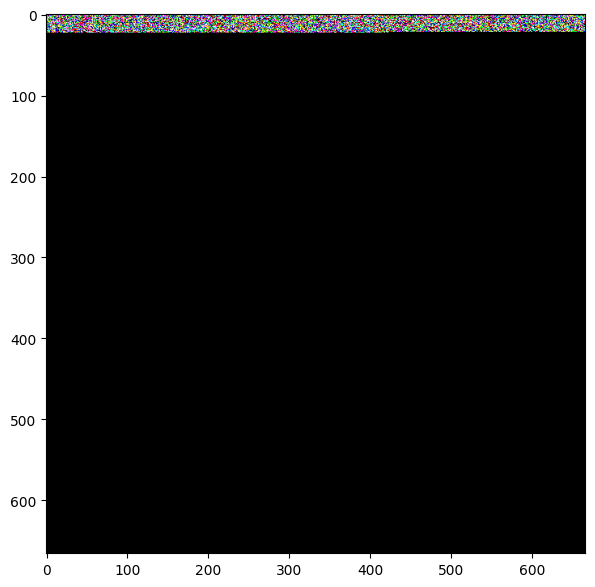

In [155]:
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_strawberries_difference2, origin='upper')

In [156]:
carrier_rgb_strawberries_image_payload2 = decode_message(carrier_rgb_strawberries_image2, 'test123')

Res: 11001111000001100000110000011000001100000110000101101100110011111000111001000011100111110101001011100000111100010111000011100111010101110101101001001100111110110100011010100010110011111001101101111010011110111001100101011111100010010001000110010100000111110011000001101000011001100110011110001110011101010110111000110100101000110011100110010111000110111010010100101010000110101011110101001101100001010100111011000100111110110011100001111101010100110110100110101010011111100010101111110111111001001100100111100011010101101001010010001101000100011011100011010010101000010110001100001011000101100101010000110010111100011010100110001011010001000001011000110010101011000011000110000111000101101011111101001100011011100110001101001110011011111110101101010111010011011101010001110101011101011001111011011010001101101010110010111101111111000100110111001101101110110101010010101111000111101011001011001101101000011101100110111110011110011001110101100100111011010110111110011110011110110100110111010100101

In [166]:
print(carrier_rgb_strawberries_image_payload2)

b'eNqdWcGO5LYRvfMreFsbGA/ixAiC9Wl3g2QnQJKBx45hGD5QEtXijiRqSanb8sm/4d/zl+S9Iimpe3dzyGGBnZZIFqtevXpVejQnq79UD6OeO6tHM1jtW/1339zJD2/8MJkYnR/NbNNP/7Shdu3Sq2+9/P1qsMHVZtST9VNv79SjNbXVldXL5Lmtj1ZfOq9b3/f+ImuCO3Wz9UvUczD18716a4M17WzDnfoWz+NSvbP1TFOGVc+mf9az16tftIuygT/bcOlsP7jxpGs/zsH3eFvVZnJ4XX/2HxPuX+rBj3b9XJux0W6O2rat7Jou68eT5/KLCbB2vlg7qiXeqwfduMD3ytFxsrgx7tj3K+3YrxSXafJh1jC+13VnxhPub+X99DKOgdVzx12jWXUb/JAPj3Z+qX7wS4BjAnyop2Cja+w406LRNnJf/Hh2cBQ2MxV24mLV2LOJs5lp/T/sxcXu4ANdfMBbpzVGN4bGGGztl75RtR94ATvCLeknbcfYm7OY+zV/7UzEv2mysORei531EgLMU9eGRrFzRGQ3A7EZruTm9WhOtlClYMj+Rtdr3YslwVYrf8bVcBSOXgYzcodiJQLPZ65R2JNnwIraTohqwuuLqHtz0Z89dSa433/9zXx+rwmleQ1mHMUSuu4jfsLBvQlIg5pgH52N+fKIigQhaItlfljvFH6nka7RtPJOfJz8iifAy+Bnd0ZgADFEFY+IV2AItsDBNH1wfY/HYjYdZwJzpSTGRGDj1r0bkW7bux0io3ofxbsu6A7xy6dfvaMP77zzVSRaBxOe5eodks7iMd4LzPpltMPU+3VgJN2o//wHvVoTYo5260YzEsc6rnG2g3KjJNHscSGJDCOYQu7hu743E9PC4dKj/uovMFICaRqAY1a8nWmQry4i58VDgDYuCx9j/RIJ5tn8PJnVBgRTUpdPALZ6sbL+vPTzgr8ZsryAu0akUswB1mdXz27AJV5FCcECP8EQ9RDMezHZjW

In [ ]:
print(zlib.decompress(base64.b64decode(carrier_rgb_strawberries_image_payload2[2:].encode('utf-8'))).decode('utf-8'))

In [172]:
def MSE(original_image, carrier_image):
	err = np.sum((original_image.astype("float") - carrier_image.astype("float")) ** 2)
	err /= float(original_image.shape[0] * original_image.shape[1])
	return err

In [174]:
MSE(rgb_lenna, carrier_rgb_lenna_image)

1.2123794555664062

In [177]:
ssim(rgb_lenna, carrier_rgb_lenna_image, channel_axis=2)

0.9957060871428837

In [179]:
psnr(rgb_lenna, carrier_rgb_lenna_image)

52.06563047187386

In [181]:
vi(rgb_lenna, carrier_rgb_lenna_image)

array([0.96830615, 0.92799648])

In [180]:
hausdorff_distance(rgb_lenna, carrier_rgb_lenna_image)

2.0

In [183]:
nrmse(rgb_lenna, carrier_rgb_lenna_image)

0.006625487825963338

In [185]:
google_memo = open("jamesdamore.txt", "r").read()

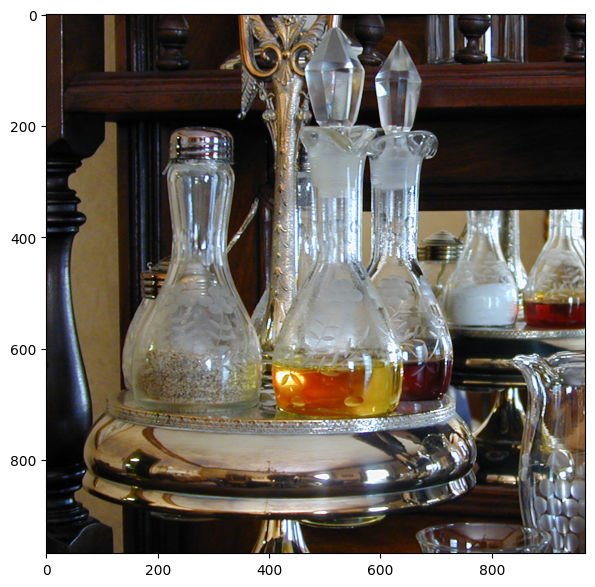

In [188]:
rgb_caster = Image.open('DIP3E_Original_Images_CH06/Fig0637(a)(caster_stand_original).tif')
rgb_caster = np.array(rgb_caster)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_caster, origin='upper')

7.287326685335701


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.9999983998575351


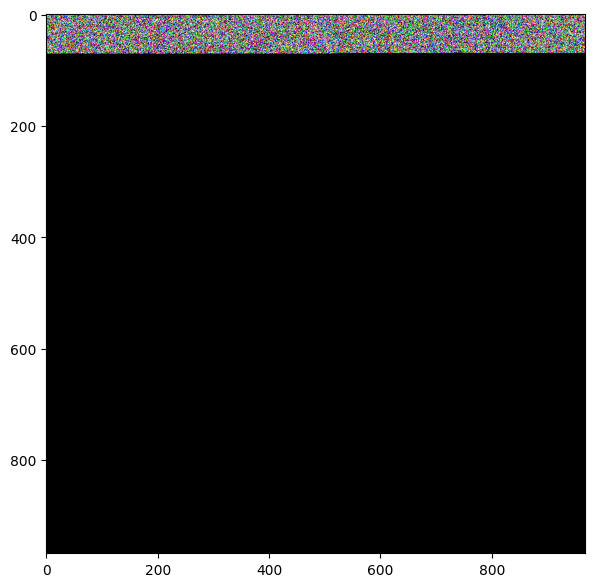

In [189]:
carrier_rgb_caster_image, carrier_rgb_caster_loss = encode_message(rgb_caster, google_memo, 'test123')
print(carrier_rgb_caster_loss)
rgb_caster_similarity, rgb_caster_difference = difference_analysis(rgb_caster, carrier_rgb_caster_image)
print(rgb_caster_similarity)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_caster_difference, origin='upper')

In [190]:
carrier_rgb_caster_image_payload = decode_message(carrier_rgb_caster_image, 'test123')

Res: 11001111000001100000110000011000001100000110000101101100110011111001011011111100100111000011100011100011010000010110001101000010010111001100101000111011010111001101001101101111101101110111011000101100111110001011001111010100101011001101111001010011001011010010111001100101011001111000001111011010110000110100111011101110000101101110011011010001110000100110011100001110001011000111001011000100110111001100111101110111010111101001100011100111111110101011111100100001100111110100011100110101100110101110110111100011000110111011110111111001101111100111100001000110101000001101110110110111100111001110110101101000111101101110011011010011100000110001110000111101111101010011100010101011111010101010101101000110010101100110011111100011100111111100011111010100110110011011011000101010110011001100101110001010110101110100010110110101111110010101001010010011011000110011001011011110110110100010011111000001100111110110101110000110101011101011010001101000011001011001110111010010000011101100101010010011001

In [191]:
print(carrier_rgb_caster_image_payload == google_memo)

True


In [192]:
compressed_google_memo = base64.b64encode(zlib.compress(google_memo.encode('utf-8'), 9))
print(len(str(compressed_google_memo)))
print(len(google_memo))

11471
21669


In [193]:
decompressed_google_memo = zlib.decompress(base64.b64decode(compressed_google_memo))

In [194]:
carrier_rgb_caster_image2, carrier_rgb_caster_loss2 = encode_message(rgb_caster, str(compressed_google_memo), 'test123')

3.82900188967056


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


0.99999916191066


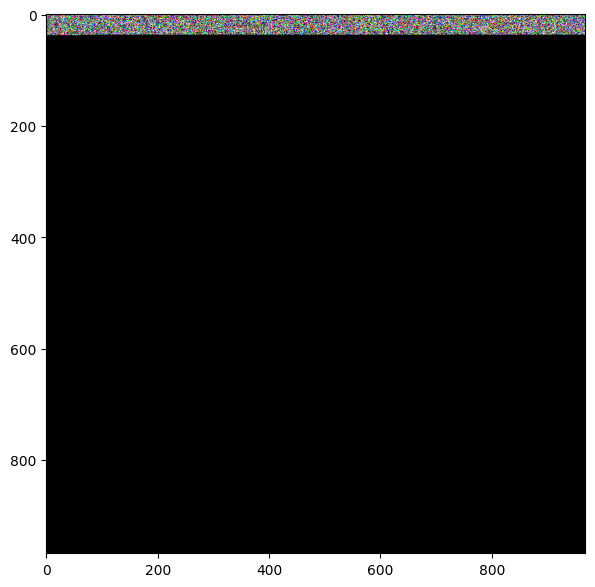

In [195]:
print(carrier_rgb_caster_loss2)
rgb_caster_similarity2, rgb_caster_difference2 = difference_analysis(rgb_caster, carrier_rgb_caster_image2)
print(rgb_caster_similarity2)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_caster_difference2, origin='upper')

In [196]:
carrier_rgb_caster_image_payload2 = decode_message(carrier_rgb_caster_image2, 'test123')

Res: 11001111000001100000110000011000001100000110000101101100110011111001101000100111000011001000110000011011011101010110110101011010100011100110110011010011001010101101001110011011010011100111110100111010101110001001101101010001011011111001101110000110001111101001000010100011111011111000111110011010110011000100111010111101001010101101100011000101111001101010101110011010000111000010111110110000011000111101111011010110001010100011000011111000111001111010101110111010100001000101111000111000111001101111001110100111001010110111011001010101101100010010011111111000101010110000010111000100011110101001111010110010001100101001010011011011001111100101110110110101111011000100111011010111001011110001110011111010101100000111000011110001101001011010001100001011011110101111101011100100011011011110011101011011000100110110111000111110100110111101101011011101100011101010110100000110111011011010011001111001011011111110101001000101001010101001101111100001010010101111010101010010010001100011110000110010011

In [197]:
decompressed_google_memo2 = zlib.decompress(base64.b64decode(carrier_rgb_caster_image_payload2[2:].encode('utf-8'))).decode('utf-8')

In [198]:
print(decompressed_google_memo2 == google_memo)

True


/usr/lib/python3/dist-packages/PIL/Image.py:2896: DecompressionBombWarning: Image size (122883147 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


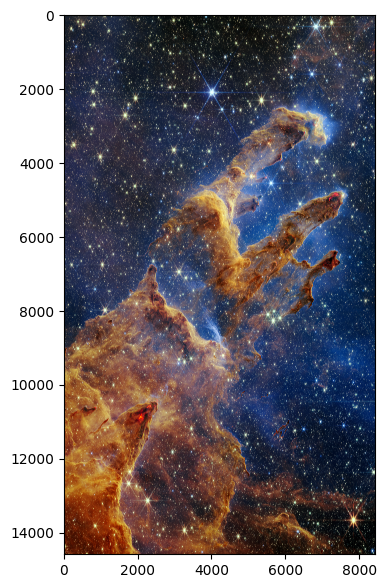

In [71]:
rgb_pillars_of_creation = Image.open('misc/pillars3.png')
rgb_pillars_of_creation = np.array(rgb_pillars_of_creation)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_pillars_of_creation, origin='upper')

In [72]:
rgb_pillars_of_creation.shape

(14589, 8423, 3)

In [73]:
shakespeare_work = open("williamshakespeare.txt", "r").read()

In [74]:
print(len(shakespeare_work))
compressed_shakespeare_work = base64.b64encode(zlib.compress(shakespeare_work.encode('utf-8'), 9))
print(len(str(compressed_shakespeare_work)))

5458195
2680939


In [ ]:
carrier_rgb_pillars_of_creation_image, carrier_rgb_pillars_of_creation_loss = encode_message(rgb_pillars_of_creation, shakespeare_work, 'test123')
print(carrier_rgb_pillars_of_creation_loss)
rgb_pillars_of_creation_similarity, rgb_pillars_of_creation_difference = difference_analysis(rgb_pillars_of_creation, carrier_rgb_pillars_of_creation_image)
print(rgb_pillars_of_creation_similarity)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_pillars_of_creation_difference, origin='upper')

In [ ]:
print(carrier_rgb_pillars_of_creation_image_payload == shakespeare_work)

In [75]:
carrier_rgb_pillars_of_creation_image2, carrier_rgb_pillars_of_creation_loss2 = encode_message(rgb_pillars_of_creation, str(compressed_shakespeare_work), 'test123')

In [ ]:
print(carrier_rgb_pillars_of_creation_loss2)
rgb_pillars_of_creation_similarity2, rgb_pillars_of_creation_difference2 = difference_analysis(rgb_pillars_of_creation, carrier_rgb_pillars_of_creation_image2)
print(rgb_pillars_of_creation_similarity2)
fig = plt.figure(figsize=(10, 7))
plt.imshow(rgb_pillars_of_creation_difference2, origin='upper')

In [ ]:
decompressed_shakespeare_work2 = zlib.decompress(base64.b64decode(carrier_rgb_pillars_of_creation_image_payload2[2:].encode('utf-8'))).decode('utf-8')

In [ ]:
print(decompressed_shakespeare_work2 == shakespeare_work)